### Your Data Analysis Project should include:

- a research goal and hypothesis
- data collection/gathering (does not need to be automated)
- exploratory data analysis in jupyter
- open ended in terms of other components. will need to be approved.

Extras:
- outside information that could be useful to your process (charts, articles, -  - links that are relevant to your topic.
- Create a README.md file containing information about your project. Keep it simple. We'll continue to add to this over time.

[simple hacks to speed up your data analysis](https://www.kaggle.com/parulpandey/10-simple-hacks-to-speed-up-your-data-analysis)

[Kaggle link to dataset](https://www.kaggle.com/zayanmakar/infectious-diseases-county-year-and-sex)

### Notes:
- include data about the listeria cantaloupe outbreak in 2011. Decide what charts you want to do for this year
- how can I show that there were outbreaks due to cantaloupe contamination almost every year from 2001 to 2014?
- what iplot charts can I include? (would be cool to have interactive charts)
- continue taking a deeper dive into 2004 and 2006 outbreaks

### Topic:  Infectious Diseases


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [3]:
import cufflinks as cf
import plotly.offline
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

### What are infectious Diseases?

Infectious Diseases are diseases caused by pathogenic microorganisms - such as parasites, viruses, or bacteria.

They can be spread, indirectly or directly (vector-borne), from animals to humans, and from person to another.

When the immune system of a host is fully functional, disease symptoms may not develop whenever an infectious organism attacks it. But, if the host immune system is compromised, or the infectious organism overwhelms the immune system, an infectious disease may take over the host's immune system. 

The discovery of antibiotics has helped slow down the spread of infectious diseases, but the misused and overused of them are creating antibiotic-resistant bacteria. It is critical to keep track of infectious diseases as they are a major public health problem.

[source](https://www.sciencedirect.com/topics/immunology-and-microbiology/infectious-diseases)

#### More links

[Modeling the coronavirus disease 2019 pandemic: A comprehensive guide of infectious disease and decision-analytic models](sciencedirect.com/science/article/pii/S089543562031204X)

[Information about infectious diseases](https://www.nfid.org/infectious-diseases/)

[The potential of wastewater-based epidemiology as surveillance and early warning of infectious disease outbreaks](https://www.sciencedirect.com/science/article/abs/pii/S2468584420300337)

[Common Infectious Diseases](https://www.sciencedirect.com/science/article/abs/pii/S0095454320300907)
[Data Mining for recognizing patterns in foodborne disease outbreaks](https://www.sciencedirect.com/science/article/abs/pii/S026087740900510X)

[What could a future of AI-augmented infectious disease surveillance look like?](https://towardsdatascience.com/what-could-a-future-of-ai-augmented-infectious-disease-surveillance-look-like-1950363ebb2c)

[How AI can help manage infectious diseases](https://www.kdnuggets.com/2020/04/ai-manage-infectious-diseases.html)

I will be working with the following dataset:

Potential Questions to ask:

1. Are foodborne disease outbreaks increasing or decreasing? 
2. What contaminant has been responsible for the most illnesses, hospitalizations, and deaths? 
3. What location for food preparation poses the greatest risk of foodborne illness?
4. What year saw the most foodborne disease outbreaks?
5. Which species had the most foodborne disease outbreaks every year from 1998 to 2015?

### Let's read the csv as a dataframe for exploratory analysis

In [4]:
df_outbreaks = pd.read_csv('data/outbreaks.csv')

[link to kaggle outbreaks dataset](https://www.kaggle.com/cdc/foodborne-diseases)

In [5]:
df_outbreaks

,Year,Month,State,Location,Food,Ingredient,Species,Serotype/Genotype,Status,Illnesses,Hospitalizations,Fatalities
0,1998,January,California,Restaurant,NaN,NaN,NaN,NaN,NaN,20,0.0,0.0
1,1998,January,California,NaN,Custard,NaN,NaN,NaN,NaN,112,0.0,0.0
2,1998,January,California,Restaurant,NaN,NaN,NaN,NaN,NaN,35,0.0,0.0
3,1998,January,California,Restaurant,"Fish, Ahi",NaN,Scombroid toxin,NaN,Confirmed,4,0.0,0.0
4,1998,January,California,Private Home/Residence,"Lasagna, Unspecified; Eggs, Other",NaN,Salmonella enterica,Enteritidis,Confirmed,26,3.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
19114,2015,December,Wisconsin,Restaurant,NaN,NaN,Norovirus genogroup II,GII_14,Confirmed,4,0.0,0.0
19115,2015,December,Wisconsin,Private Home/Residence,Salsa,NaN,Norovirus genogroup II,GII_2,Confirmed,16,0.0,0.0
19116,2015,December,Wisconsin,Nursing Home/Assisted Living Facility,NaN,NaN,Norovirus genogroup II,GII_17 Kawasaki (2014),Confirmed,43,3.0,0.0
19117,2015,December,Wisconsin,Fast Food Restaurant,NaN,NaN,Norovirus genogroup II,GII_2,Confirmed,5,0.0,0.0


#### Getting info about the dataframe. There's 19,119 entries in the dataframe

In [6]:
df_outbreaks.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19119 entries, 0 to 19118
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Year               19119 non-null  int64  
 1   Month              19119 non-null  object 
 2   State              19119 non-null  object 
 3   Location           16953 non-null  object 
 4   Food               10156 non-null  object 
 5   Ingredient         1876 non-null   object 
 6   Species            12500 non-null  object 
 7   Serotype/Genotype  3907 non-null   object 
 8   Status             12500 non-null  object 
 9   Illnesses          19119 non-null  int64  
 10  Hospitalizations   15494 non-null  float64
 11  Fatalities         15518 non-null  float64
dtypes: float64(2), int64(2), object(8)
memory usage: 1.2+ MB


#### This is providing the number of missing values per column

The column illnesses has 0 missing values, whereas hospitalizations and fatalities have 3625 and 3601 missing values, respectively. There are 19,119 entries, so both hospitalizations and fatalities have about 18% of their data missing.

In [7]:
df_outbreaks.isna().sum()

Year                     0
Month                    0
State                    0
Location              2166
Food                  8963
Ingredient           17243
Species               6619
Serotype/Genotype    15212
Status                6619
Illnesses                0
Hospitalizations      3625
Fatalities            3601
dtype: int64

### Dropping Serotype/Genotype and ingredient columns since there were very few non-null values and I won't use them for this analysis

In [16]:
df_outbreaks.drop(['Ingredient', 'Serotype/Genotype'], axis=1)

,Year,Month,State,Location,Food,Species,Status,Illnesses,Hospitalizations,Fatalities
0,1998,January,California,Restaurant,NaN,NaN,NaN,20,0.0,0.0
1,1998,January,California,NaN,Custard,NaN,NaN,112,0.0,0.0
2,1998,January,California,Restaurant,NaN,NaN,NaN,35,0.0,0.0
3,1998,January,California,Restaurant,"Fish, Ahi",Scombroid toxin,Confirmed,4,0.0,0.0
4,1998,January,California,Private Home/Residence,"Lasagna, Unspecified; Eggs, Other",Salmonella enterica,Confirmed,26,3.0,0.0
...,...,...,...,...,...,...,...,...,...,...
19114,2015,December,Wisconsin,Restaurant,NaN,Norovirus genogroup II,Confirmed,4,0.0,0.0
19115,2015,December,Wisconsin,Private Home/Residence,Salsa,Norovirus genogroup II,Confirmed,16,0.0,0.0
19116,2015,December,Wisconsin,Nursing Home/Assisted Living Facility,NaN,Norovirus genogroup II,Confirmed,43,3.0,0.0
19117,2015,December,Wisconsin,Fast Food Restaurant,NaN,Norovirus genogroup II,Confirmed,5,0.0,0.0


#### This method helps us to see the  range of years in the dataframe.

The years range from 1998 to 2015.

In [17]:
df_outbreaks['Year'].unique()

array([1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008,
       2009, 2010, 2011, 2012, 2013, 2014, 2015], dtype=int64)

#### And this is showing the number of unique values per column. As you can see, there's 201 different species responsible for foodborn disease outbreaks in the US from 1998 to 2015 

In [18]:
df_outbreaks.nunique()

Year                   18
Month                  12
State                  55
Location              161
Food                 3127
Ingredient            381
Species               201
Serotype/Genotype     239
Status                 22
Illnesses             302
Hospitalizations       61
Fatalities             12
dtype: int64

### Displaying the top 10 foods that caused the highest number of illnesses from 1998 to 2015

In [19]:
df_food = df_outbreaks.groupby('Food', as_index = False).sum().sort_values('Illnesses', ascending = False).head(10)
df_food

,Food,Year,Illnesses,Hospitalizations,Fatalities
1744,Multiple Foods,412571,5451,82.0,1.0
2324,"Salad, Unspecified",236520,2650,80.0,0.0
2033,"Pork, Bbq",160392,2401,162.0,3.0
2890,"Tomato, Unspecified",38075,2356,161.0,4.0
2075,Potato Salad,132276,2177,35.0,0.0
2573,"Shell Egg, Other",8011,1994,12.0,0.0
579,"Chicken, Other",166270,1825,53.0,1.0
475,Chicken Salad,134281,1770,46.0,0.0
1848,"Other Milk, Pasteurized",4010,1744,12.0,0.0
2366,"Salsa, Unspecified",66115,1712,22.0,1.0


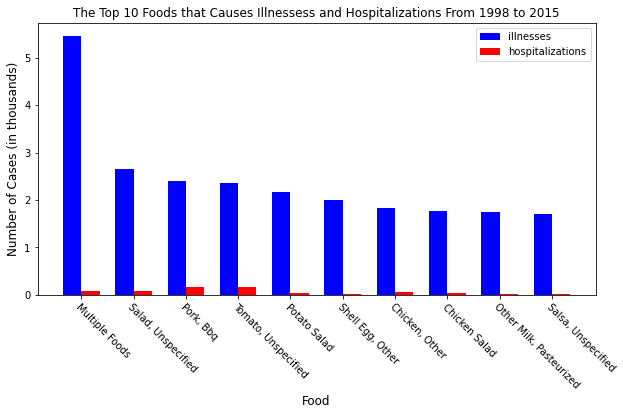

In [20]:
x = df_food['Food']
y1 = df_food['Illnesses']/1000
y2 = df_food['Hospitalizations']/1000
width = 0.35
m = np.arange(10)
labels = df_food['Food']

fig, ax = plt.subplots(figsize=(10,5))
ax.bar(m - width/2,y1, label = 'illnesses', width = width, color = 'blue')
ax.bar(m + width/2,y2, label = 'hospitalizations', width = width, color = 'red')
plt.title('The Top 10 Foods that Causes Illnessess and Hospitalizations From 1998 to 2015', fontsize = 12)
plt.xlabel('Food', fontsize=12)
ax.set_xticks(m)
ax.set_xticklabels(labels)
plt.xticks(rotation=-45, ha="left", rotation_mode="anchor")
plt.ylabel('Number of Cases (in thousands)', fontsize=12)
plt.legend()
# ax.xaxis.set_major_locator(plt.MaxNLocator(7))
plt.show()

#### Grouping by location and calculating the total number of illness cases, hospitalizations, and fatalities per location
Sorting by illnesses in descending order to see the location of the highest number of people that fell ill 

The 5 locations with the highest number of illnesses are a restaurant, catering service, private home/residence, prison/jail, and university/college. We see that outbreaks occurred in locations that tend to host a high number of people in their facilities. This could be because food tends to be made in high quantities, so if food is contaminated, it is easier to have a high amount of food contaminated and distributed to people. 

In [22]:
location_df = df_outbreaks[['Location', 'Illnesses', 'Hospitalizations', 'Fatalities']].groupby('Location', as_index = False).sum().sort_values(by='Illnesses', ascending = False).head(20)
location_df

,Location,Illnesses,Hospitalizations,Fatalities
98,Restaurant,131970,4665.0,62.0
9,Catering Service,36044,412.0,4.0
65,Private Home/Residence,22564,2526.0,82.0
64,Prison/Jail,20608,173.0,4.0
155,School/College/University,19910,213.0,0.0
0,Banquet Facility,12272,83.0,1.0
160,Unknown,7648,389.0,5.0
55,Nursing Home/Assisted Living Facility,5625,293.0,44.0
105,Restaurant; Catering Service,5243,122.0,3.0
30,Fast Food Restaurant,4336,329.0,1.0


### Finding the top 6 locations where outbreaks occurred from 1998 to 2015 (deleting this)

In [23]:
loc = location_df['Location'][:6] #deleting this cell

print(f'The top 6 locations where foodborne disease outbreaks occurred are:')
for item in loc:
    print(item)

The top 6 locations where foodborne disease outbreaks occurred are:
Restaurant
Catering Service
Private Home/Residence
Prison/Jail
School/College/University
Banquet Facility


### Sorting the dataframe by the 'fatalities' column and returning it in descending order

This shows that in July of 2011 there was a foodborne disease outbreak that occurred in multiple states with the highest fatalities. This outbreak was from contamination of cantaloupe from listeria monocytogenes. The location is private home/residence


In [24]:
df_outbreaks.sort_values(by='Fatalities', ascending = False)

,Year,Month,State,Location,Food,Ingredient,Species,Serotype/Genotype,Status,Illnesses,Hospitalizations,Fatalities
15329,2011,July,Multistate,Private Home/Residence,Cantaloupe,Cantaloupe,Listeria monocytogenes,NaN,Confirmed,147,143.0,33.0
1062,1998,October,Multistate,NaN,"Hot Dog, Unspecified",NaN,Listeria monocytogenes,NaN,Confirmed,101,101.0,21.0
13108,2008,September,Multistate,NaN,Peanut Butter; Peanut Paste,NaN,Salmonella enterica,Typhimurium,Confirmed,714,166.0,9.0
6043,2002,July,Multistate,Restaurant,"Deli Meat, Sliced Turkey",NaN,Listeria monocytogenes,NaN,Confirmed,54,NaN,8.0
3251,2000,May,Multistate,Restaurant,"Deli Meat, Sliced Turkey",Turkey,Listeria monocytogenes,NaN,Confirmed,29,29.0,7.0
...,...,...,...,...,...,...,...,...,...,...,...,...
18844,2015,August,Washington DC,Office/Indoor Workplace,"Fish, Amberjack",NaN,Ciguatoxin,NaN,Suspected,6,NaN,NaN
18921,2015,October,Illinois,Farm/Dairy,NaN,NaN,Cryptosporidium parvum,IIaA17G2R2,Confirmed,103,NaN,NaN
18989,2015,November,Illinois,Restaurant,NaN,NaN,Norovirus,NaN,Suspected,9,NaN,NaN
19059,2015,December,Illinois,Catering Service,NaN,NaN,NaN,NaN,NaN,3,NaN,NaN


### What other times has cantaaloupe caused outbreaks?

July 2011 had the highest number of fatalies, and the second highest number of illness cases that were caused by a contamination of cantaloupe.

##### What led to contamination of cantaloupes?

In [34]:
df_outbreaks[df_outbreaks['Food'] == 'Cantaloupe']

,Year,Month,State,Location,Food,Ingredient,Species,Serotype/Genotype,Status,Illnesses,Hospitalizations,Fatalities
2259,1999,September,Minnesota,Restaurant; Catering Service,Cantaloupe,NaN,Norovirus genogroup I,NaN,Suspected,5,0.0,0.0
3114,2000,April,Multistate,Restaurant; Private Home/Residence; Grocery St...,Cantaloupe,NaN,Salmonella enterica,Poona,Confirmed,47,11.0,0.0
4438,2001,April,Multistate,Grocery Store,Cantaloupe,NaN,Salmonella enterica,Poona,Confirmed,50,9.0,2.0
4456,2001,April,Oregon,Restaurant; Nursing Home/Assisted Living Facility,Cantaloupe,NaN,Salmonella enterica,NaN,Confirmed,2,0.0,0.0
5691,2002,April,Multistate,Private Home/Residence; Grocery Store; Nursing...,Cantaloupe,NaN,Salmonella enterica,Poona,Confirmed,48,10.0,NaN
12318,2007,December,Multistate,Restaurant; Private Home/Residence; Hospital,Cantaloupe,NaN,Salmonella enterica,Litchfield,Confirmed,53,17.0,0.0
13245,2008,November,Multistate,NaN,Cantaloupe,NaN,Salmonella enterica,Javiana,Confirmed,10,NaN,NaN
13281,2008,December,California,Restaurant,Cantaloupe,NaN,Norovirus genogroup II,Unknown,Confirmed,23,0.0,0.0
14982,2011,February,Multistate,Private Home/Residence,Cantaloupe,NaN,Salmonella enterica,Panama,Confirmed,20,3.0,0.0
15246,2011,June,Multistate,NaN,Cantaloupe,NaN,Salmonella enterica,Uganda,Confirmed,25,4.0,0.0


In [35]:
df_outbreaks[df_outbreaks['Food'] == 'Cantaloupe'].sort_values(by='Illnesses', ascending = False)


,Year,Month,State,Location,Food,Ingredient,Species,Serotype/Genotype,Status,Illnesses,Hospitalizations,Fatalities
16158,2012,July,Multistate,Private Home/Residence,Cantaloupe,NaN,Salmonella enterica; Salmonella enterica,Typhimurium; Newport,Confirmed; Confirmed,261,94.0,3.0
15329,2011,July,Multistate,Private Home/Residence,Cantaloupe,Cantaloupe,Listeria monocytogenes,NaN,Confirmed,147,143.0,33.0
16853,2013,May,Minnesota,Restaurant,Cantaloupe,Cantaloupe,Norovirus,NaN,Suspected,59,0.0,0.0
12318,2007,December,Multistate,Restaurant; Private Home/Residence; Hospital,Cantaloupe,NaN,Salmonella enterica,Litchfield,Confirmed,53,17.0,0.0
4438,2001,April,Multistate,Grocery Store,Cantaloupe,NaN,Salmonella enterica,Poona,Confirmed,50,9.0,2.0
5691,2002,April,Multistate,Private Home/Residence; Grocery Store; Nursing...,Cantaloupe,NaN,Salmonella enterica,Poona,Confirmed,48,10.0,NaN
3114,2000,April,Multistate,Restaurant; Private Home/Residence; Grocery St...,Cantaloupe,NaN,Salmonella enterica,Poona,Confirmed,47,11.0,0.0
16162,2012,July,Multistate,Private Home/Residence,Cantaloupe,NaN,Salmonella enterica,Newport,Confirmed,33,11.0,1.0
15246,2011,June,Multistate,NaN,Cantaloupe,NaN,Salmonella enterica,Uganda,Confirmed,25,4.0,0.0
16160,2012,July,Multistate,Private Home/Residence,Cantaloupe,NaN,Salmonella enterica,Newport,Confirmed,24,5.0,0.0


### We can see that in February 2010 there was a Salmonella outbreak that occurred in multiple states, which has the highest number of illnesses cases for all years. The food that was contaminated was a shell egg. This outbreak occured in many locations, including restaurants, private home, prison/jail.

In [25]:
df_outbreaks.sort_values(by='Illnesses', ascending = False)

,Year,Month,State,Location,Food,Ingredient,Species,Serotype/Genotype,Status,Illnesses,Hospitalizations,Fatalities
14169,2010,February,Multistate,Restaurant; Restaurant; Private Home/Residence...,"Shell Egg, Other",Egg,Salmonella enterica,Enteritidis,Confirmed,1939,NaN,NaN
10396,2006,May,California,Prison/Jail,"Other Milk, Pasteurized",NaN,Campylobacter jejuni,NaN,Confirmed,1644,7.0,0.0
12678,2008,April,Multistate,NaN,"Peppers, Jalapeno; Tomato, Unspecified; Pepper...",NaN,Salmonella enterica,Saintpaul,Confirmed,1500,308.0,2.0
10282,2006,April,Colorado,NaN,NaN,NaN,Norovirus genogroup I,NaN,Confirmed,1200,1.0,0.0
6701,2003,January,Texas,Unknown,NaN,NaN,Shigella sonnei,NaN,Confirmed,964,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
5655,2002,April,Illinois,Restaurant,NaN,NaN,NaN,NaN,NaN,2,0.0,0.0
5656,2002,April,Illinois,Restaurant,NaN,NaN,Norovirus genogroup I,GI_1,Confirmed,2,0.0,0.0
1965,1999,July,Alabama,Restaurant,NaN,NaN,NaN,NaN,NaN,2,0.0,0.0
9693,2005,August,Illinois,Restaurant,NaN,NaN,NaN,NaN,NaN,2,0.0,0.0


### 2004 experienced the highest number of reported illnesses at 29034 cases, 779 hospitalizations, and 22 fatalities.

In 2006, there was 28,656 cases of illnesses, a smaller number of cases compared to 2004, but there was a higher number of hospitalizations (1170 campared to 779 hospitalizations in 2004).

##### Question: What diseases led the high cases of illnesses in 2004 and 2006? What is the breakdown of the main diseases in these two years?

In [26]:
df_year = df_outbreaks.groupby('Year', as_index = False).sum().sort_values('Illnesses', ascending = False)
df_year

,Year,Illnesses,Hospitalizations,Fatalities
6,2004,29034,779.0,22.0
8,2006,28656,1170.0,10.0
0,1998,27156,886.0,33.0
2,2000,26033,728.0,22.0
3,2001,25192,665.0,11.0
4,2002,24939,734.0,14.0
1,1999,24899,598.0,10.0
10,2008,23089,1250.0,22.0
5,2003,23079,687.0,24.0
9,2007,20970,877.0,18.0


### The following graph depicts the total number of cases per year from 1998 to 2015. Overall, there was been a decrease in the number of illnesses cases caused by outbreaks in the US.

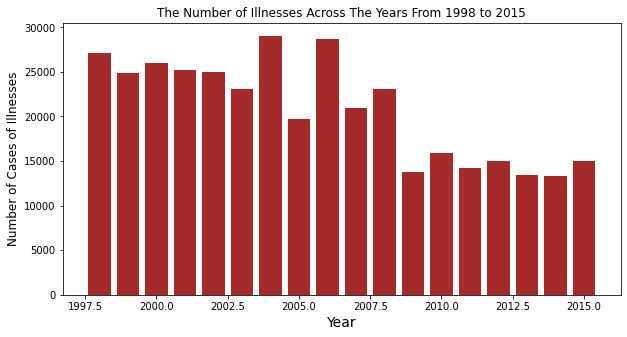

In [33]:
x = df_year['Year']
illnesses = df_year['Illnesses']
# hospitalizations = df_year['']

fig, ax = plt.subplots(figsize = (10,5))
ax.bar(x,y, color = 'brown')
plt.title('The Number of Illnesses Across The Years From 1998 to 2015', fontsize = 12)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Number of Cases of Illnesses', fontsize=12)
# ax.xaxis.set_major_locator(plt.MaxNLocator(7))
plt.show()

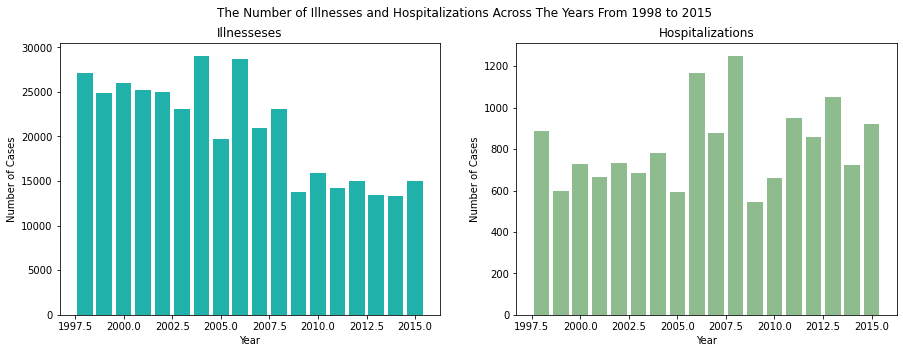

In [55]:
x = df_year['Year']
illnesses = df_year['Illnesses']

hospitalizations = df_year['Hospitalizations']

fig, (axes1, axes2) = plt.subplots(1,2, figsize = (15,5))
axes1.bar(x,illnesses, color = 'lightseagreen')
axes1.set(xlabel = 'Year', ylabel= 'Number of Cases', title = 'Illnesseses')

axes2.bar(x,hospitalizations, color = 'darkseagreen')
axes2.set(xlabel = 'Year', ylabel= 'Number of Cases', title = 'Hospitalizations')

plt.suptitle('The Number of Illnesses and Hospitalizations Across The Years From 1998 to 2015', fontsize = 12)
# ax.xaxis.set_major_locator(plt.MaxNLocator(7))
plt.show()

### Since 2004 and 2006 showed a high number of illness cases, I'll be taking a deeper analysis for those two years to understand the distributions of cases

In [60]:
df_2004 = df_outbreaks[df_outbreaks['Year'] == 2004]

In [62]:
df_2004.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1328 entries, 7716 to 9043
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Year               1328 non-null   int64  
 1   Month              1328 non-null   object 
 2   State              1328 non-null   object 
 3   Location           1248 non-null   object 
 4   Food               725 non-null    object 
 5   Ingredient         104 non-null    object 
 6   Species            946 non-null    object 
 7   Serotype/Genotype  182 non-null    object 
 8   Status             946 non-null    object 
 9   Illnesses          1328 non-null   int64  
 10  Hospitalizations   1073 non-null   float64
 11  Fatalities         1082 non-null   float64
dtypes: float64(2), int64(2), object(8)
memory usage: 93.4+ KB


In [68]:
df_2004.groupby('Species').sum().sort_values('Illnesses', ascending = False)

,Year,Illnesses,Hospitalizations,Fatalities
Species,,,,
Norovirus genogroup I,927852,13347,132.0,0.0
Salmonella enterica,278556,2845,252.0,9.0
Clostridium perfringens,108216,2227,8.0,3.0
Norovirus genogroup II,38076,1129,32.0,0.0
Staphylococcus aureus,78156,595,21.0,0.0
Salmonella enterica; Salmonella enterica; Salmonella enterica; Salmonella enterica; Salmonella enterica; Salmonella enterica,2004,429,129.0,0.0
Virus,16032,404,14.0,0.0
"Escherichia coli, Enteropathogenic",6012,384,3.0,0.0
Norovirus unknown,24048,377,1.0,0.0


In [70]:
df_2004[df_2004['Species'] == 'Norovirus genogroup I']

,Year,Month,State,Location,Food,Ingredient,Species,Serotype/Genotype,Status,Illnesses,Hospitalizations,Fatalities
7716,2004,January,Arizona,Restaurant,"Pizza, Unspecified",NaN,Norovirus genogroup I,NaN,Suspected,12,0.0,0.0
7718,2004,January,California,Restaurant,NaN,NaN,Norovirus genogroup I,NaN,Suspected,35,0.0,0.0
7720,2004,January,California,Restaurant; Catering Service,"Salad, Unspecified",NaN,Norovirus genogroup I,NaN,Suspected,21,0.0,0.0
7722,2004,January,California,NaN,Ice,NaN,Norovirus genogroup I,NaN,Suspected,50,0.0,0.0
7724,2004,January,California,Restaurant,NaN,NaN,Norovirus genogroup I,NaN,Suspected,27,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
9035,2004,December,Washington,Restaurant,Seafood-Based Salad Unspecified,NaN,Norovirus genogroup I,NaN,Suspected,11,0.0,0.0
9036,2004,December,Washington,Restaurant,NaN,NaN,Norovirus genogroup I,NaN,Suspected,2,0.0,0.0
9039,2004,December,Wisconsin,Catering Service,"Corn, Unspecified",NaN,Norovirus genogroup I,NaN,Confirmed,47,3.0,0.0
9041,2004,December,Wisconsin,Restaurant,Multiple Foods,NaN,Norovirus genogroup I,NaN,Confirmed,103,1.0,0.0


group values by month and species??

### Checking the distribution of cases of illnesses, hospitalizations, and fatalities

<AxesSubplot:>

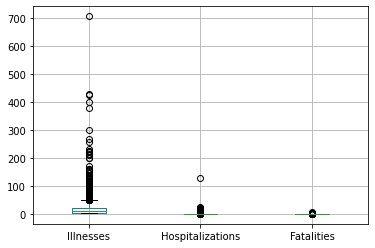

In [65]:
df_2004.boxplot(column = ['Illnesses', 'Hospitalizations', 'Fatalities'])

### Grouping illnesses, hospitalizations, and fatalities by State, and summing the total number of cases for each column.

From this, we can see that California had 39,992 cases of foodborn disease illnesses, the highest number of illnesses from 1998 to 2015, followed by Illinois with 24,700

In [16]:
df_outbreaks[['State', 'Illnesses', 'Hospitalizations', 'Fatalities']].groupby(by = 'State').sum().sort_values('Illnesses', ascending = False)

,Illnesses,Hospitalizations,Fatalities
State,,,
California,39992,1062.0,26.0
Illinois,24700,713.0,5.0
Multistate,24573,4011.0,150.0
Florida,23050,684.0,23.0
Ohio,20451,659.0,8.0
New York,17407,591.0,12.0
Michigan,14471,357.0,5.0
Texas,14187,337.0,14.0
Minnesota,13533,373.0,3.0


In [29]:
df_outbreaks.iplot(kind = 'scatter')